# Physical Flow Account for Greenhouse Gas Emissions in Canada

In this project, GreenHouse Gas (GHG) emissions by industries and households in Canada is studied. The primary GHG's in Earth's atmosphere are water vapor ($H_{2}O$), carbon dioxide ($CO_{2}$), methane ($CH_{4}$), nitrous oxide ($N_{2}$O), Chlorofluorocarbons (CFCs), Hydrofluorocarbons (HFCs) and ozone ($O_{3}$). GGH emission from 124 sectors have been included in this data set, five major emission sources: 
- Industries and householdsi
- Combustion of fossil fuels and biomass;
- Non-combustion uses of fossil fuels;  
- Agricultural soils; 
- Crop and animal production, etc. .



## Project Plan
- Project Goal
- Dataset and features
- Data analysis: Exploratory Analysis
- Patterns,  features and unusual feature of data
- Impacts on overall greenhouse effect
- Conclusions

## Data Source
- Statistics Canada,
- Environment,  
- Energy and Transportation Statistics Division.
- Physical flow account for greenhouse gas emissions
- DOI:   https://doi.org/10.25318/3810009701-eng

## Exploratory Data Analysis

In [479]:
%matplotlib inline
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.offline as pyo
import matplotlib as mpl
# Import the models

from sklearn import linear_model
from sklearn.model_selection import cross_val_score
import seaborn as sns
import statsmodels.api as sm
from matplotlib import pyplot as plt
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.arima_model import ARIMA

from statsmodels.tsa.ar_model import AutoReg, ar_select_order
from statsmodels.tsa.api import acf, pacf, graphics

from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()
from dateutil.parser import parse
from scipy.optimize import curve_fit


from sklearn.linear_model import LinearRegression
from sklearn import linear_model
import datetime


# Data Cleaning
### Import Data Files

In [480]:
#Lets import data as a pandas Dataframe
data1 = pd.read_csv('../PFGE-Model/38100097-eng/38100097.csv', parse_dates=['REF_DATE'])

## Create Copies of Original files

Copies of the original files using copy before cleaning just in case you need to restore some of the original contents.

In [481]:
df = pd.read_csv('../PFGE-Model/38100097-eng/38100097.csv')
data = pd.read_csv('../PFGE-Model/38100097-eng/38100097.csv', parse_dates=['REF_DATE'])

In [482]:
plt.rcParams.update({'figure.figsize': (10, 7), 'figure.dpi': 120})

##### Combine Data Files if needed, we can use concat , or merge function to combine

In [483]:
#Combine two data files
#combdata = pd.concat([data1, data2], 
#                         ignore_index=True)
#combdata.info()  

#### Find the  name of the data column

In [484]:
print(data.columns)

Index(['REF_DATE', 'GEO', 'DGUID', 'Sector', 'UOM', 'UOM_ID', 'SCALAR_FACTOR',
       'SCALAR_ID', 'VECTOR', 'COORDINATE', 'VALUE', 'STATUS', 'SYMBOL',
       'TERMINATED', 'DECIMALS'],
      dtype='object')


####  Data features head(nRows), default, 5 rows

In [485]:
data.head(2)

,REF_DATE,GEO,DGUID,Sector,UOM,UOM_ID,SCALAR_FACTOR,SCALAR_ID,VECTOR,COORDINATE,VALUE,STATUS,SYMBOL,TERMINATED,DECIMALS
0,2009-01-01,Canada,2016A000011124,"Total, industries and households",Kilotonnes,198,units,0,v79874995,1.1,718062.0,NaN,NaN,NaN,0
1,2009-01-01,Canada,2016A000011124,"Total, industries",Kilotonnes,198,units,0,v79874996,1.2,579966.0,NaN,NaN,NaN,0


In [486]:
data.tail(2)

,REF_DATE,GEO,DGUID,Sector,UOM,UOM_ID,SCALAR_FACTOR,SCALAR_ID,VECTOR,COORDINATE,VALUE,STATUS,SYMBOL,TERMINATED,DECIMALS
15748,2017-01-01,Nunavut,2016A000262,Balancing item: Non-energy Products from Fuels...,Kilotonnes,198,units,0,v1013974924,14.125,1.0,NaN,NaN,NaN,0
15749,2017-01-01,Nunavut,2016A000262,Balancing item: Other differences,Kilotonnes,198,units,0,v1013974925,14.126,-3.0,NaN,NaN,NaN,0


####  Access the  data column using the square bracket syntax and use .unique() to inspect the option

In [487]:
data['STATUS'].unique()

array([nan, '0s'], dtype=object)

#### Drop Not a Number (nan),   dropna(subset=[‘STATUS’])

In [488]:
#data= data.dropna(subset=['STATUS'])

Number of rows and column of data

In [489]:
data.shape

(15750, 15)

#### Find if there is any missing data

Note: False means no missing data, true means missing data 

In [490]:
# data.isna()

Total number of missing values (null values) for each columns

In [491]:
data.isna().sum()

REF_DATE             0
GEO                  0
DGUID                0
Sector               0
UOM                  0
UOM_ID               0
SCALAR_FACTOR        0
SCALAR_ID            0
VECTOR               0
COORDINATE           0
VALUE             2269
STATUS           13481
SYMBOL           15750
TERMINATED       15750
DECIMALS             0
dtype: int64

Total missing values

In [492]:
data.isna().sum().sum()

47250

#### Creating a new data column with all null values in new data frame 

In [493]:
data["Null Column"]= None

#### Checking if column is inserted properly  

In [494]:
print(data1.columns.values, "\n", data.columns.values) 

['REF_DATE' 'GEO' 'DGUID' 'Sector' 'UOM' 'UOM_ID' 'SCALAR_FACTOR'
 'SCALAR_ID' 'VECTOR' 'COORDINATE' 'VALUE' 'STATUS' 'SYMBOL' 'TERMINATED'
 'DECIMALS'] 
 ['REF_DATE' 'GEO' 'DGUID' 'Sector' 'UOM' 'UOM_ID' 'SCALAR_FACTOR'
 'SCALAR_ID' 'VECTOR' 'COORDINATE' 'VALUE' 'STATUS' 'SYMBOL' 'TERMINATED'
 'DECIMALS' 'Null Column']


#### Comparing values before dropping null column 

In [495]:
print("\nColumn number before dropping Null column\n", 
       len(data1.dtypes), len(data.dtypes)) 


Column number before dropping Null column
 15 16


#### Dropping column with all null values 

In [496]:
data.dropna(axis = 1, how ='all', inplace = True)

#### Comparing values after dropping null column 

In [497]:
print("\nColumn number after dropping Null column\n", 
      len(data1.dtypes), len(data.dtypes)) 


Column number after dropping Null column
 15 13


####  Iterating directly over the values of the list, and inspect the data option

In [498]:
sectors = {i[0] : i[1] for i in enumerate(data['Sector'].unique())}
sectors

{0: 'Total, industries and households',
 1: 'Total, industries',
 2: 'Crop and animal production [BS11A00]',
 3: 'Forestry and logging [BS11300]',
 4: 'Fishing, hunting and trapping [BS11400]',
 5: 'Support activities for agriculture and forestry [BS11500]',
 6: 'Oil and gas extraction [BS21100]',
 7: 'Coal mining [BS21210]',
 8: 'Metal ore mining [BS21220]',
 9: 'Non-metallic mineral mining and quarrying [BS21230]',
 10: 'Support activities for mining and oil and gas extraction [BS21300]',
 11: 'Electric power generation, transmission and distribution [BS22110]',
 12: 'Natural gas distribution, water, sewage and other systems [BS221A0]',
 13: 'Residential building construction [BS23A00]',
 14: 'Non-residential building construction [BS23B00]',
 15: 'Transportation engineering construction [BS23C10]',
 16: 'Oil and gas engineering construction [BS23C20]',
 17: 'Electric power engineering construction [BS23C30]',
 18: 'Communication engineering construction [BS23C40]',
 19: 'Other engin

#### Again use .unique() to inspect the another data option

In [499]:
GeoName = {i[0] : i[1] for i in enumerate(data['GEO'].unique())}
GeoName

{0: 'Canada',
 1: 'Newfoundland and Labrador',
 2: 'Prince Edward Island',
 3: 'Nova Scotia',
 4: 'New Brunswick',
 5: 'Quebec',
 6: 'Ontario',
 7: 'Manitoba',
 8: 'Saskatchewan',
 9: 'Alberta',
 10: 'British Columbia',
 11: 'Yukon',
 12: 'Northwest Territories',
 13: 'Nunavut'}

In [500]:
len(data.columns)

13

In [501]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15750 entries, 0 to 15749
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   REF_DATE       15750 non-null  datetime64[ns]
 1   GEO            15750 non-null  object        
 2   DGUID          15750 non-null  object        
 3   Sector         15750 non-null  object        
 4   UOM            15750 non-null  object        
 5   UOM_ID         15750 non-null  int64         
 6   SCALAR_FACTOR  15750 non-null  object        
 7   SCALAR_ID      15750 non-null  int64         
 8   VECTOR         15750 non-null  object        
 9   COORDINATE     15750 non-null  float64       
 10  VALUE          13481 non-null  float64       
 11  STATUS         2269 non-null   object        
 12  DECIMALS       15750 non-null  int64         
dtypes: datetime64[ns](1), float64(2), int64(3), object(7)
memory usage: 1.6+ MB


# Visualization of Greenhouse Gas emission

#### Total industries and household emission  from 2009 to 2017 in Canada

In [502]:
fig = px.line(data[(data['GEO']=="Canada") 
            & (data['Sector']==sectors[0])]
            , x='REF_DATE', y = "VALUE")
fig.update_layout(
    title="GHG Emission in Canada",
    xaxis_title="Year",
    yaxis_title="Emission in Canada (Kilotonnes)",
)
fig.show()


#### Total industries and household emission  from 2009 to 2017 in Saskatchewan

In [503]:
fig = px.line(data[(data['GEO']=="Saskatchewan") 
            & (data['Sector']==sectors[0])]
            , x='REF_DATE', y = "VALUE")
fig.update_layout(
    title="GHG Emission in SK",
    xaxis_title="Year",
    yaxis_title="Emission in SK (Kilotonnes)",
)
fig.show()

### Total industries and household emission from 2009 to 2017 in Alberta

In [504]:
fig = px.line(data[(data['GEO']=="Alberta") 
            & (data['Sector']==sectors[0])]
            , x='REF_DATE', y = "VALUE")
fig.update_layout(
    title="GHG Emission in Alberta",
    xaxis_title="Year",
    yaxis_title="Emission in Alberta (Kilotonnes)",
)
fig.show()

#### Total industries and household emission  from 2009 to 2017, from all the provinces and territories  using animation 

##### GHG emission vary significantly by province and territory, and this is due to differences in population, energy sources and economic base.

In [505]:
fig = px.bar(df[(df['GEO']!="Canada") 
            & (df['Sector']==sectors[0])]
            , x='GEO', y = "VALUE",animation_frame="REF_DATE")
fig.update_layout(
    title="GHG Emission in Canada",
    xaxis_title="Year ",
    yaxis_title="Emission (Kilotonnes)"
)
fig.show()

####  Total industries and household emission from 2009 to 2017, from all the provinces and territories Per Capita Income

This is done  by dividing emissions by the provincial population

In [506]:
#df2 = df
#for i in range(len(sectors)):
#    if(i!=1 and i!=113):
#        df2 = df2[df2["Sector"]!=sectors[i]]

#### Total industries and total household emission from 2009 to 2017  from all the provinces and territories, plot on top of each other

####  Emission  by all the sectors except sector 0, 1, 113,116 and 117 from  2009 to 2017 in  Canada

#### 0: 'Total, industries and households',
#### 1: 'Total, industries',
#### 113: 'Total, households',
#### 116: "Total, United Nations Framework Convention on Climate Change (UNFCCC), Canada's submission",
#### 117: "Total, Reconciliation with Canada's submission to the United Nations Framework Convention on Climate Change (UNFCCC)",

In [507]:
fig = px.bar(df[(df['GEO']!="Canada")
               & (df["Sector"]!=sectors[0])
               & (df["Sector"]!=sectors[1])
               & (df["Sector"]!=sectors[116])
               & (df["Sector"]!=sectors[113])
               & (df["Sector"]!=sectors[117])], x='GEO', y = "VALUE", 
             color = "Sector",animation_frame="REF_DATE")
fig.update_traces(showlegend=False)
fig.show()

### Total industries and household emission from 2009 to 2017 in Canada, and  from all the provinces and territories

In [508]:
fig = px.line(df[(df['Sector']==sectors[0])], x='REF_DATE', y = "VALUE", 
             color = "GEO", color_discrete_sequence=px.colors.qualitative.Dark24)
fig.update_traces(mode='markers+lines')
fig.update_layout(
    title="Gasoline Price in Canadian cities",
    xaxis_title="Year",
    yaxis_title="Gasoline Price (CAD)",
)
fig.show()


### Total industries and household emission  from 2009 to 2017 in  Canada 

In [519]:
fig = px.scatter(df, x="VALUE", y="GEO", color="REF_DATE",
                color_discrete_sequence=px.colors.qualitative.Dark24)
fig.for_each_trace(
    lambda trace: trace.update(name=trace.name.replace("=", ": ")),
)
fig.update_layout(
    title="GHG Emission in Canada",
    xaxis_title="Emission in Canada (Kilotonnes)",
    yaxis_title="Provinces",
)

fig.show()

#### Total industries and household, Total United Nations Framework Convention on Climate Change (UNFCCC) Canada's submission!, total industries only emission from 2009 to 2017 in Canada, and other provinces

In [511]:
fig = px.line(df, x='REF_DATE', y = "VALUE", 
             color = "GEO",line_group="Sector",hover_name="Sector")
fig.update_layout(
    title="GHG Emission in Canada",
    xaxis_title="Year",
    yaxis_title="Emission in Canada (Kilotonnes)",)
fig.show()

#### Emission from all the sectors except sector 0, 1, 113,116, 117 in Canada from 2017¶

In [512]:
fig = px.pie(df[(df["GEO"]=="Canada")
               & (df["Sector"]!=sectors[0])
               & (df["Sector"]!=sectors[1])
               & (df["Sector"]!=sectors[113])
               & (df["Sector"]!=sectors[116])
               & (df["Sector"]!=sectors[117])
               & (df["REF_DATE"]==2017)]
             , values="VALUE",color="Sector"
)
fig.update_traces(textposition='inside', textinfo='percent')
fig.show()

#### Emission from all the sectors except sector 0, 1, 113,116, 117 in Saskatchewan from 2017

In [513]:
fig = px.pie(df[(df["GEO"]=="Saskatchewan")
               & (df["Sector"]!=sectors[0])
               & (df["Sector"]!=sectors[1])
               & (df["Sector"]!=sectors[113])
               & (df["REF_DATE"]==2017)
               & (df["Sector"]!=sectors[116])
               & (df["Sector"]!=sectors[117])]
             , values="VALUE",color="Sector"
)
fig.update_traces(textposition='inside', textinfo='percent')
fig.show()

#### Emission from all the sectors except sector 0, 1, 113,116, 117 in Alberta from 2017

In [514]:
fig = px.pie(df[(df["GEO"]=="Alberta")
               & (df["Sector"]!=sectors[0])
               & (df["Sector"]!=sectors[1])
               & (df["Sector"]!=sectors[113])
               & (df["REF_DATE"]==2017)
               & (df["Sector"]!=sectors[116])
               & (df["Sector"]!=sectors[117])]
             , values="VALUE",color="Sector"
)
fig.update_traces(textposition='inside', textinfo='percent')
fig.show()

### All the provincial plots together

In [515]:
GEO = {i[0]:i[1] for i in enumerate(df["GEO"].unique())}
print(GEO)

specs = [[{"type":"pie"},{"type":"pie"}],
        [{"type":"pie"},{"type":"pie"}],
        [{"type":"pie"},{"type":"pie"}],
        [{"type":"pie"},{"type":"pie"}],
        [{"type":"pie"},{"type":"pie"}],
        [{"type":"pie"},{"type":"pie"}],
        [{"type":"pie"},{"type":"pie"}]
        ]

fig = make_subplots(rows=7, cols=2,specs=specs,subplot_titles=GEO)

for i in range(1,8):
    for j in range(1,3):
        if(i+j-2 < 13):
            df3 = df[(df["GEO"]==GEO[i+j-1])
                   & (df["Sector"]!=sectors[0])
                   & (df["Sector"]!=sectors[1])
                   & (df["Sector"]!=sectors[113])
                   & (df["REF_DATE"]==2017)
                   & (df["Sector"]!=sectors[116])
                   & (df["Sector"]!=sectors[117])]
            fig.add_trace(go.Pie(values=df3["VALUE"],labels = df3["Sector"]),i,j)
            fig.update_traces(hoverinfo='label+percent', textposition="inside",textinfo='percent',showlegend=False)
fig.update_layout(width=2000,height=3000,autosize=True)
fig.write_html("test.html")
fig.show()

{0: 'Canada', 1: 'Newfoundland and Labrador', 2: 'Prince Edward Island', 3: 'Nova Scotia', 4: 'New Brunswick', 5: 'Quebec', 6: 'Ontario', 7: 'Manitoba', 8: 'Saskatchewan', 9: 'Alberta', 10: 'British Columbia', 11: 'Yukon', 12: 'Northwest Territories', 13: 'Nunavut'}


# GEO: Canada 

In [516]:
df_ca = df[(df['GEO']=="Canada") & (df['Sector']==sectors[0])]
df_ca.head(2)

,REF_DATE,GEO,DGUID,Sector,UOM,UOM_ID,SCALAR_FACTOR,SCALAR_ID,VECTOR,COORDINATE,VALUE,STATUS,SYMBOL,TERMINATED,DECIMALS
0,2009,Canada,2016A000011124,"Total, industries and households",Kilotonnes,198,units,0,v79874995,1.1,718062.0,NaN,NaN,NaN,0
1750,2010,Canada,2016A000011124,"Total, industries and households",Kilotonnes,198,units,0,v79874995,1.1,732759.0,NaN,NaN,NaN,0


In [521]:
Value_ca = df_ca[["REF_DATE","VALUE"]]
Value_ca

,REF_DATE,VALUE
0,2009,718062.0
1750,2010,732759.0
3500,2011,745387.0
5250,2012,751000.0
7000,2013,762520.0
8750,2014,766435.0
10500,2015,767289.0
12250,2016,749066.0
14000,2017,760139.0


In [523]:
Value_ca = Value_ca.set_index('REF_DATE')
Value_ca

,VALUE
REF_DATE,
2009,718062.0
2010,732759.0
2011,745387.0
2012,751000.0
2013,762520.0
2014,766435.0
2015,767289.0
2016,749066.0
2017,760139.0


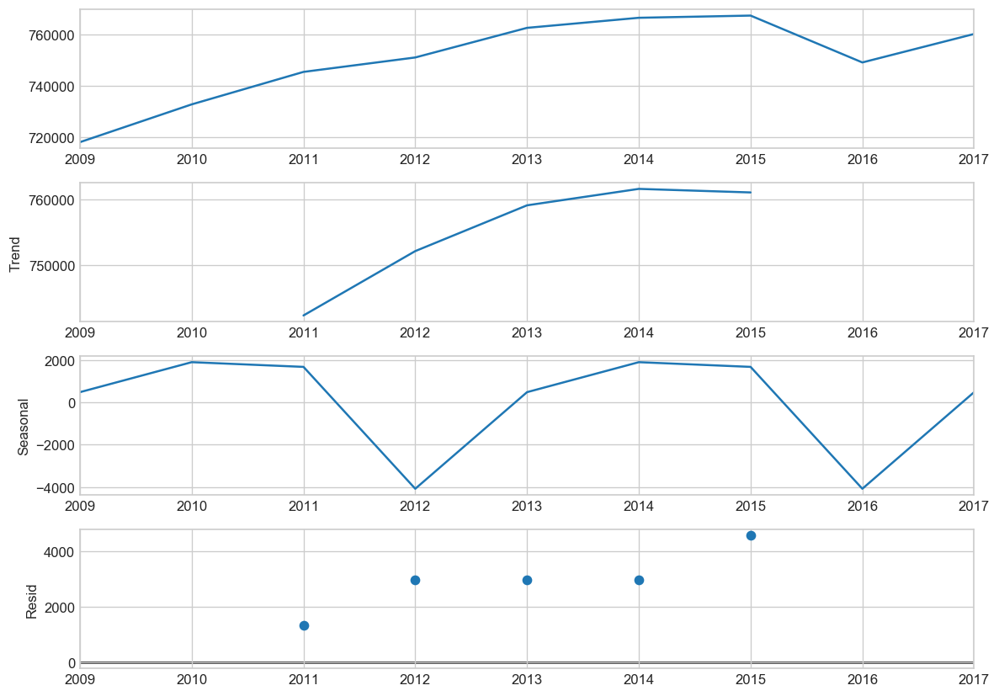

In [543]:
decomposition = sm.tsa.seasonal_decompose(Value_ca, model ='additive', period = 4)
fig =decomposition.plot()

In [553]:
#decomposition = sm.tsa.seasonal_decompose(Value_ca, model ='multiplicative', period = 4)
#fig =decomposition.plot()

In [597]:
decomposition.weights

REF_DATE
2009    1.0
2010    1.0
2011    1.0
2012    1.0
2013    1.0
2014    1.0
2015    1.0
2016    1.0
2017    1.0
Name: weights, dtype: float64

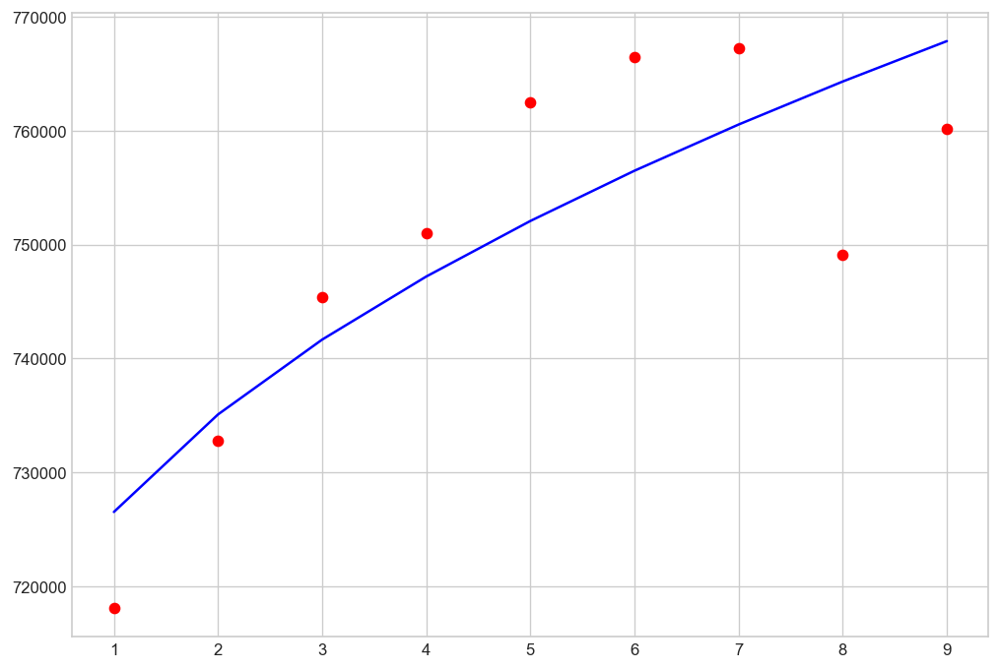

In [612]:
def fit_func(x,a,b):
    return a*pow(x,0.5)+b
y_value = Value_ca.VALUE
y_measured_error = np.sqrt(y_value)
#y_value = y_value/np.max(y_value)
x_value = np.arange(2009,2018,1)-2008
params,cov = curve_fit(fit_func,x_value,y_value,sigma=y_measured_error)
plt.plot(x_value,y_value,'ro')
plt.plot(x_value,fit_func(x_value,params[0],params[1]),'b-')
plt.show()

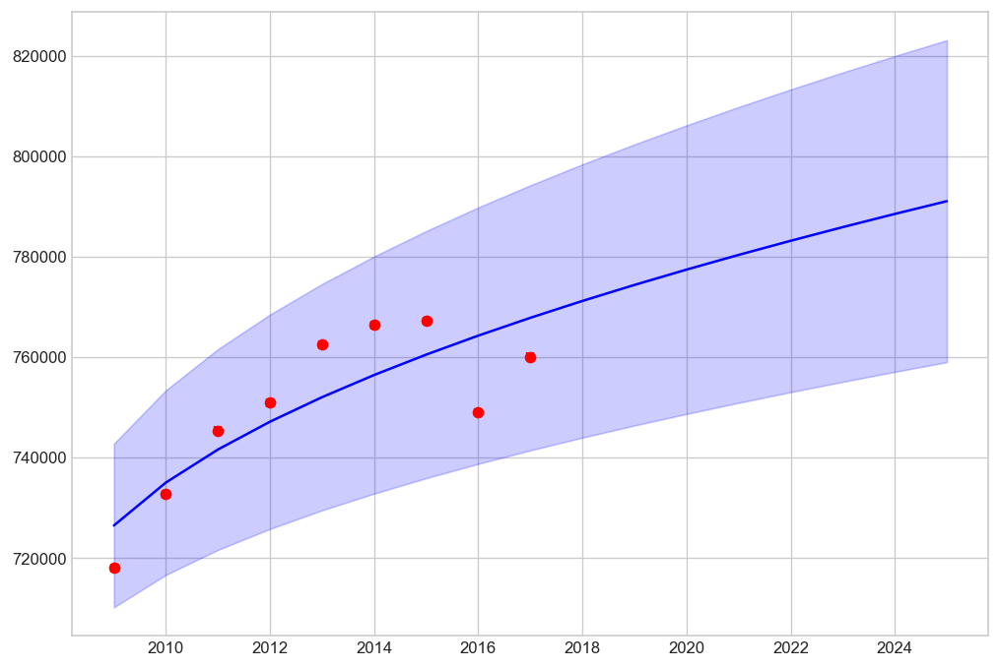

In [613]:
sigma_error = np.sqrt(np.diag(cov))
x_extra = np.arange(2009,2026,1)-2008
y_extra = fit_func(x_extra,params[0],params[1])
y_error = fit_func(x_extra,sigma_error[0],sigma_error[1])

plt.style.use('seaborn-whitegrid')
plt.plot(x_extra+2008,fit_func(x_extra,params[0],params[1]),'b-')
plt.fill_between(x_extra+2008,y_extra-y_error,y_extra+y_error,color='blue',alpha=0.2)
plt.errorbar(x_value+2008,y_value,yerr=y_measured_error,fmt='ro',elinewidth=5)

plt.show()

In [614]:
ar_model = sm.regression.linear_model.OLS(Value_ca.VALUE, np.arange(2009, 2018, 1))

In [615]:
res=ar_model.fit()
res

In [616]:
res.params

x1    372.731867
dtype: float64

In [617]:
res.summary()

/Users/dpaudyal/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1535: UserWarning:

kurtosistest only valid for n>=20 ... continuing anyway, n=9



<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                  VALUE   R-squared (uncentered):                   1.000
Model:                            OLS   Adj. R-squared (uncentered):              1.000
Method:                 Least Squares   F-statistic:                          2.057e+04
Date:                Tue, 10 Mar 2020   Prob (F-statistic):                    6.25e-15
Time:                        21:27:47   Log-Likelihood:                         -99.190
No. Observations:                   9   AIC:                                      200.4
Df Residuals:                       8   BIC:                                      200.6
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
x1           372.7319      2.599    143.424      0.000     366.739     378.725
==============================================================================
Omnibus:                        2.032   Durbin-Watson:                   0.497
Prob(Omnibus):                  0.362   Jarque-Bera (JB):                0.987
Skew:                          -0.787   Prob(JB):                        0.611
Kurtosis:                       2.607   Cond. No.                         1.00
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [618]:
y = res.predict(np.arange(2019, 2022, 1))

In [652]:
#plt.plot(np.arange(2019,2022),y,'ro')

In [653]:
mod = sm.tsa.AutoReg(Value_ca.VALUE,[1], trend='t', seasonal=False, missing = 'drop')
res_AutoReg = mod.fit(cov_type="HC0")
res_AutoReg.summary()

/Users/dpaudyal/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.



<class 'statsmodels.iolib.summary.Summary'>
"""
                            AutoReg Model Results                             
==============================================================================
Dep. Variable:                  VALUE   No. Observations:                    9
Model:                     AutoReg(1)   Log Likelihood                 -83.654
Method:               Conditional MLE   S.D. of innovations           8415.532
Date:                Tue, 10 Mar 2020   AIC                             18.826
Time:                        21:49:06   BIC                             18.855
Sample:                             1   HQIC                            18.625
                                    9                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
trend      -2466.7992   1696.199     -1.454      0.146   -5791.287     857.689
VALUE.L1       1.0250      0.009    113.249      0.000       1.007       1.043
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1            0.9756           +0.0000j            0.9756            0.0000
-----------------------------------------------------------------------------
"""

/Users/dpaudyal/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

/Users/dpaudyal/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.



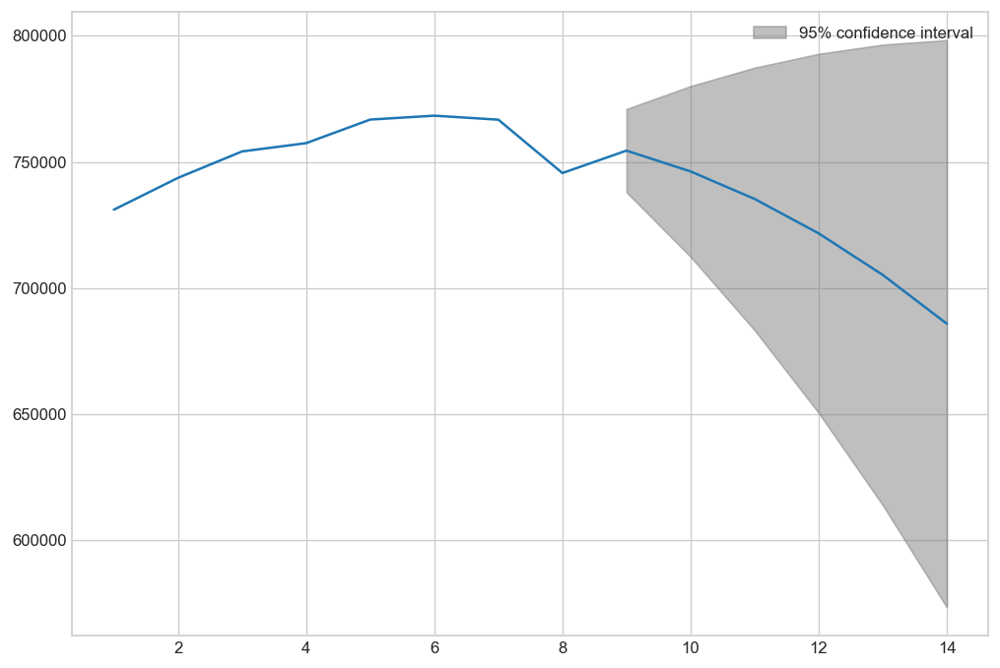

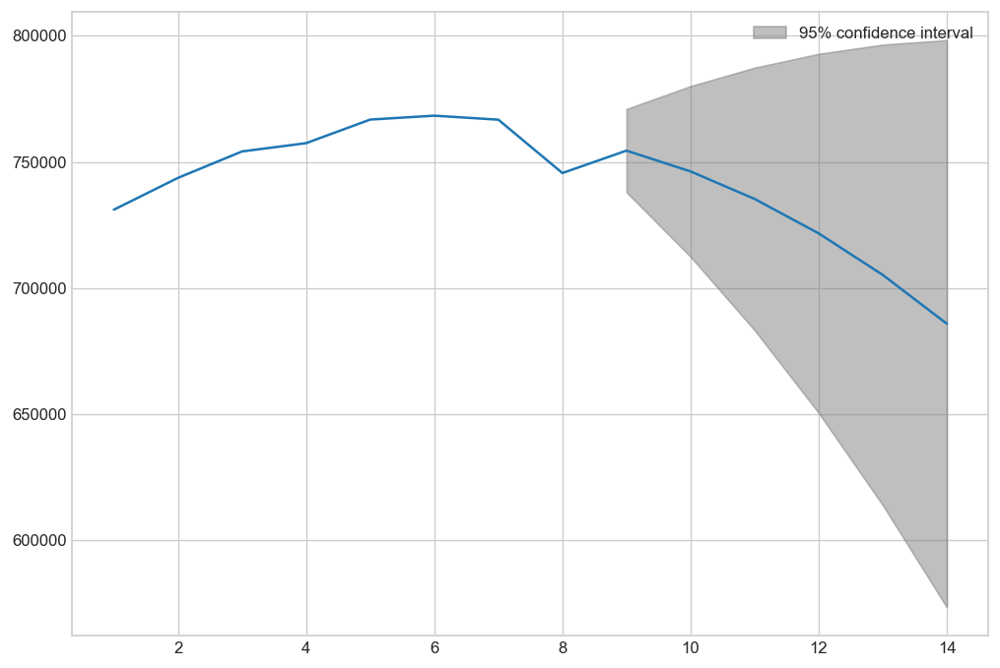

In [654]:
res_AutoReg.plot_predict(start=0,end=14)

# GEO: Saskatchewan

In [620]:
df_sk = df[(df['GEO']=="Saskatchewan") & (df['Sector']==sectors[0])]
df_sk.head(2)

,REF_DATE,GEO,DGUID,Sector,UOM,UOM_ID,SCALAR_FACTOR,SCALAR_ID,VECTOR,COORDINATE,VALUE,STATUS,SYMBOL,TERMINATED,DECIMALS
1000,2009,Saskatchewan,2016A000247,"Total, industries and households",Kilotonnes,198,units,0,v1013974177,9.1,68043.0,NaN,NaN,NaN,0
2750,2010,Saskatchewan,2016A000247,"Total, industries and households",Kilotonnes,198,units,0,v1013974177,9.1,67349.0,NaN,NaN,NaN,0


In [621]:
Value_sk = df_sk[["REF_DATE","VALUE"]]
Value_sk

,REF_DATE,VALUE
1000,2009,68043.0
2750,2010,67349.0
4500,2011,66666.0
6250,2012,68919.0
8000,2013,71533.0
9750,2014,73993.0
11500,2015,76261.0
13250,2016,73330.0
15000,2017,75165.0


In [622]:
Value_sk = Value_sk.set_index('REF_DATE')
Value_sk

,VALUE
REF_DATE,
2009,68043.0
2010,67349.0
2011,66666.0
2012,68919.0
2013,71533.0
2014,73993.0
2015,76261.0
2016,73330.0
2017,75165.0


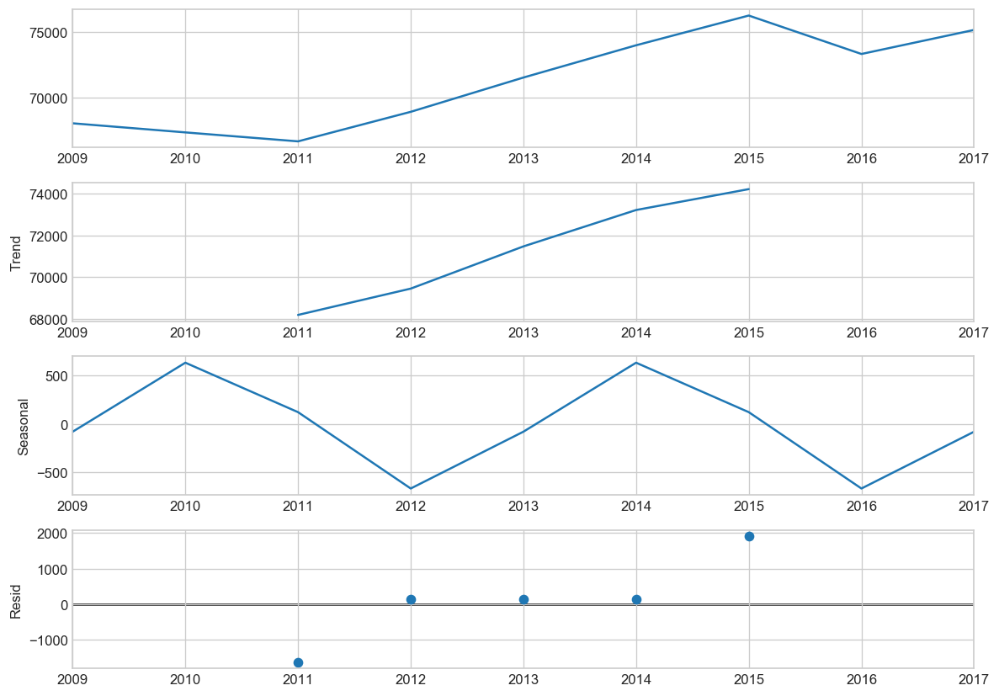

In [623]:
decomposition = sm.tsa.seasonal_decompose(Value_sk, model ='additive', period = 4)
fig =decomposition.plot()

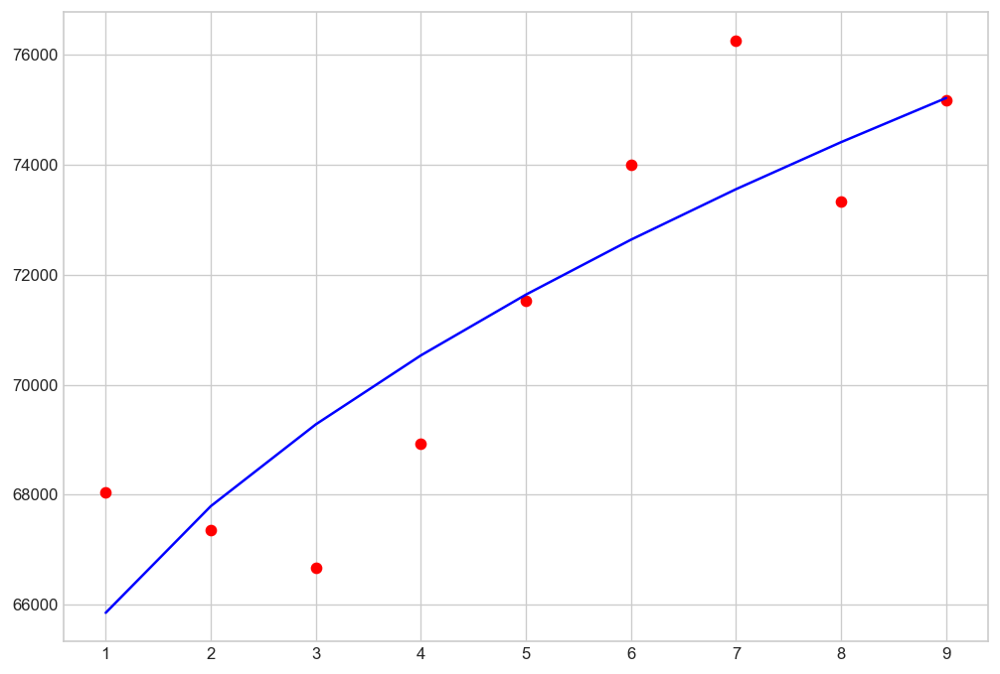

In [624]:
def fit_func(x,a,b):
    return a*pow(x,0.5)+b
y_value = Value_sk.VALUE
y_measured_error = np.sqrt(y_value)
#y_value = y_value/np.max(y_value)
x_value = np.arange(2009,2018,1)-2008
params,cov = curve_fit(fit_func,x_value,y_value,sigma=y_measured_error)
plt.plot(x_value,y_value,'ro')
plt.plot(x_value,fit_func(x_value,params[0],params[1]),'b-')
plt.show()

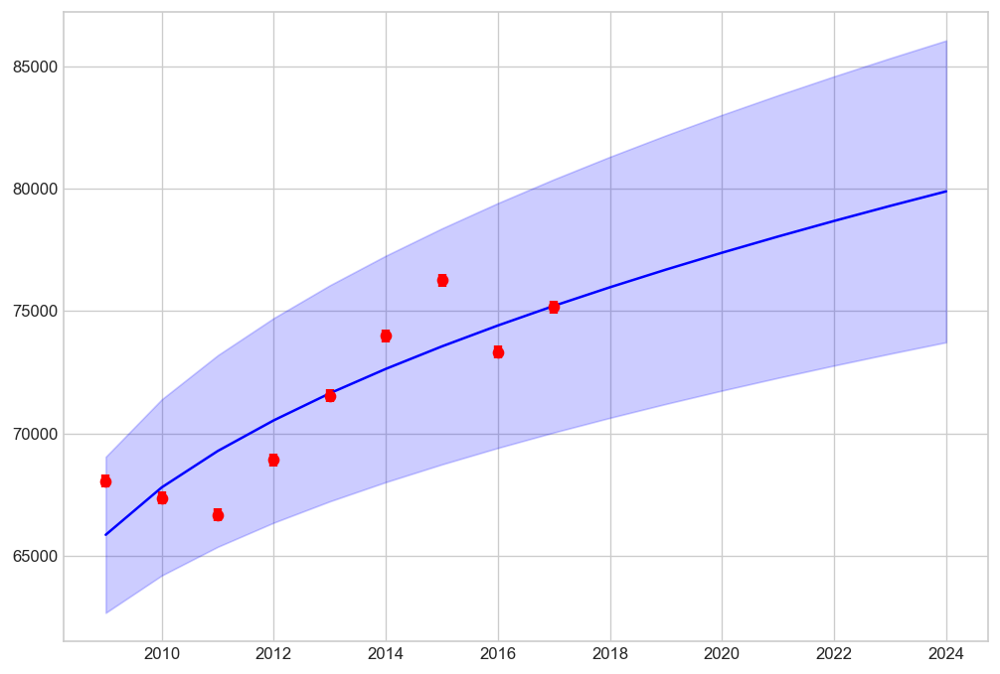

In [625]:
sigma_error = np.sqrt(np.diag(cov))
x_extra = np.arange(2009,2025,1)-2008
y_extra = fit_func(x_extra,params[0],params[1])
y_error = fit_func(x_extra,sigma_error[0],sigma_error[1])

plt.style.use('seaborn-whitegrid')
plt.plot(x_extra+2008,fit_func(x_extra,params[0],params[1]),'b-')
plt.fill_between(x_extra+2008,y_extra-y_error,y_extra+y_error,color='blue',alpha=0.2)
plt.errorbar(x_value+2008,y_value,yerr=y_measured_error,fmt='ro',elinewidth=5)

plt.show()

In [655]:
mod = sm.tsa.AutoReg(Value_sk.VALUE,[1], trend='t', seasonal=False, missing = 'drop')
res_AutoReg = mod.fit(cov_type="HC0")
res_AutoReg.summary()

/Users/dpaudyal/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.



<class 'statsmodels.iolib.summary.Summary'>
"""
                            AutoReg Model Results                             
==============================================================================
Dep. Variable:                  VALUE   No. Observations:                    9
Model:                     AutoReg(1)   Log Likelihood                 -71.849
Method:               Conditional MLE   S.D. of innovations           1924.027
Date:                Tue, 10 Mar 2020   AIC                             15.874
Time:                        21:49:31   BIC                             15.904
Sample:                             1   HQIC                            15.673
                                    9                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
trend        103.5236    292.686      0.354      0.724    -470.130     677.178
VALUE.L1       1.0041      0.020     49.462      0.000       0.964       1.044
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1            0.9959           +0.0000j            0.9959            0.0000
-----------------------------------------------------------------------------
"""

/Users/dpaudyal/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

/Users/dpaudyal/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.



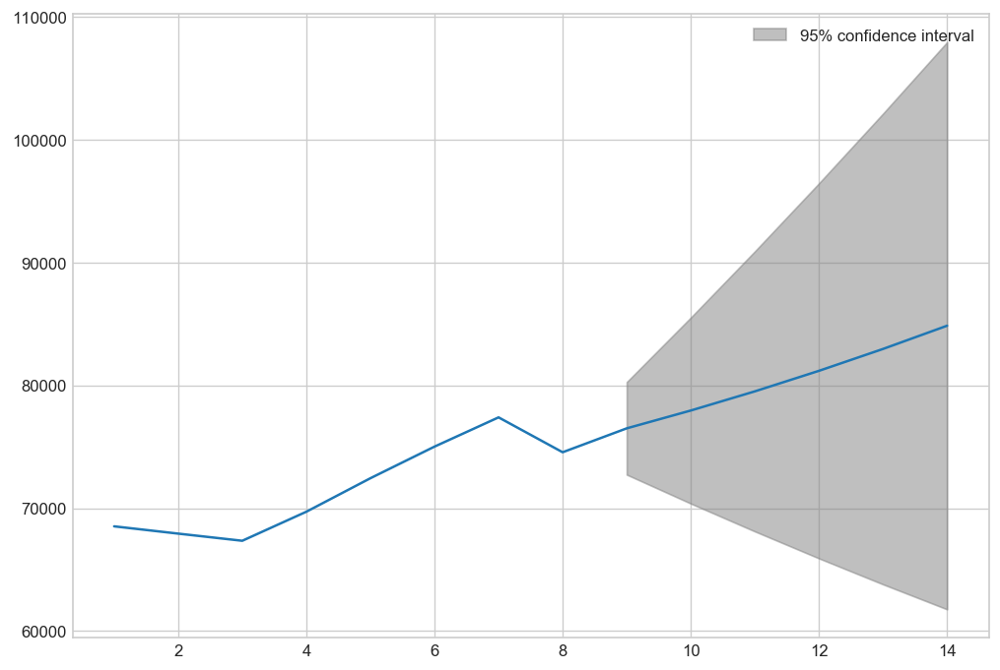

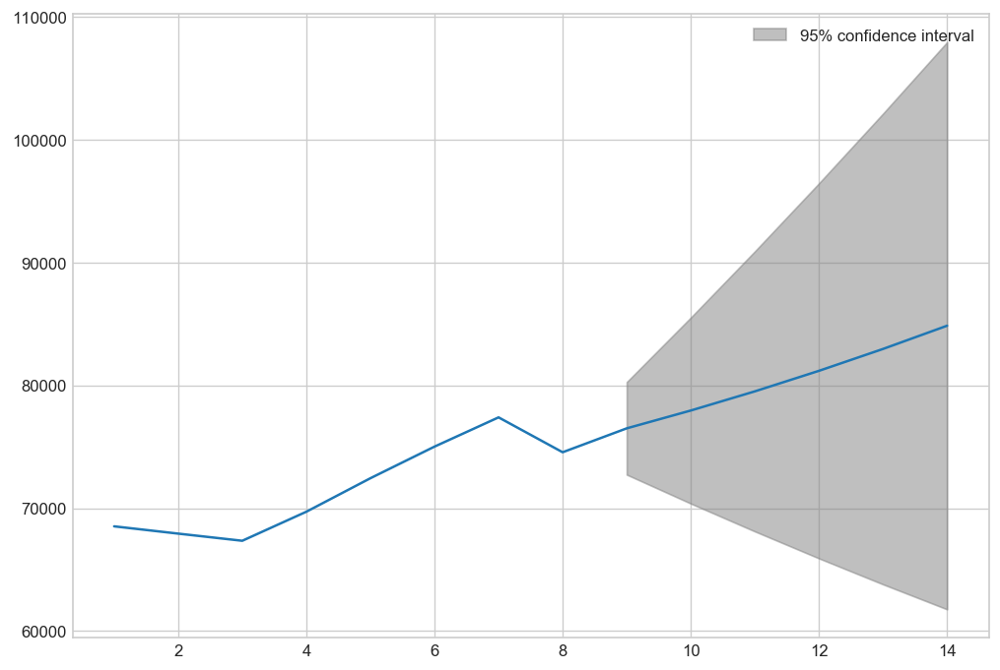

In [656]:
res_AutoReg.plot_predict(start=0,end=14)

# GEO: Alberta

In [626]:
df_ab = df[(df['GEO']=="Alberta") & (df['Sector']==sectors[0])]
df_ab.head(2)

,REF_DATE,GEO,DGUID,Sector,UOM,UOM_ID,SCALAR_FACTOR,SCALAR_ID,VECTOR,COORDINATE,VALUE,STATUS,SYMBOL,TERMINATED,DECIMALS
1125,2009,Alberta,2016A000248,"Total, industries and households",Kilotonnes,198,units,0,v1013974302,10.1,237458.0,NaN,NaN,NaN,0
2875,2010,Alberta,2016A000248,"Total, industries and households",Kilotonnes,198,units,0,v1013974302,10.1,243979.0,NaN,NaN,NaN,0


In [627]:
Value_ab = df_ab[["REF_DATE","VALUE"]]
Value_ab

,REF_DATE,VALUE
1125,2009,237458.0
2875,2010,243979.0
4625,2011,254765.0
6375,2012,265955.0
8125,2013,278529.0
9875,2014,284717.0
11625,2015,283499.0
13375,2016,270004.0
15125,2017,281520.0


In [628]:
Value_ab = Value_ab.set_index('REF_DATE')
Value_ab

,VALUE
REF_DATE,
2009,237458.0
2010,243979.0
2011,254765.0
2012,265955.0
2013,278529.0
2014,284717.0
2015,283499.0
2016,270004.0
2017,281520.0


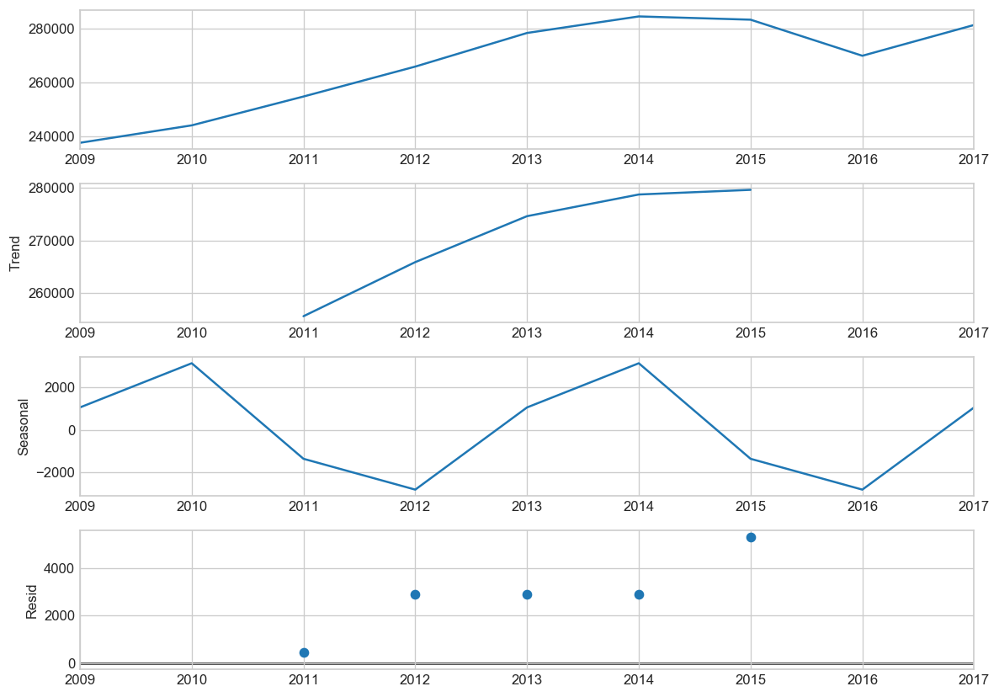

In [629]:
decomposition = sm.tsa.seasonal_decompose(Value_ab, model ='additive', period = 4)
fig =decomposition.plot()

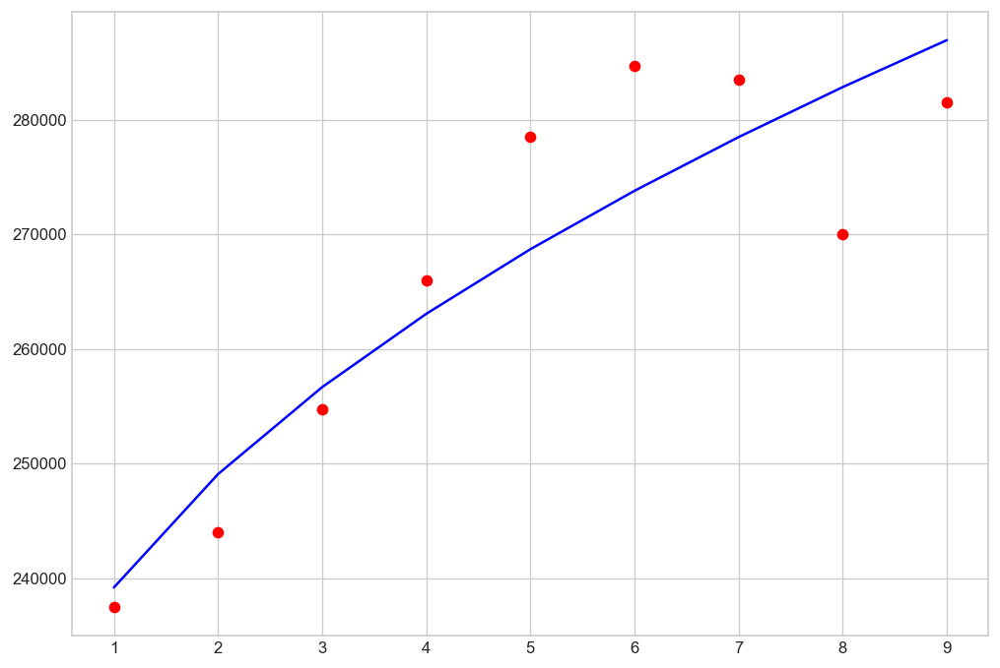

In [630]:
def fit_func(x,a,b):
    return a*pow(x,0.5)+b
y_value = Value_ab.VALUE
y_measured_error = np.sqrt(y_value)
#y_value = y_value/np.max(y_value)
x_value = np.arange(2009,2018,1)-2008
params,cov = curve_fit(fit_func,x_value,y_value,sigma=y_measured_error)
plt.plot(x_value,y_value,'ro')
plt.plot(x_value,fit_func(x_value,params[0],params[1]),'b-')
plt.show()

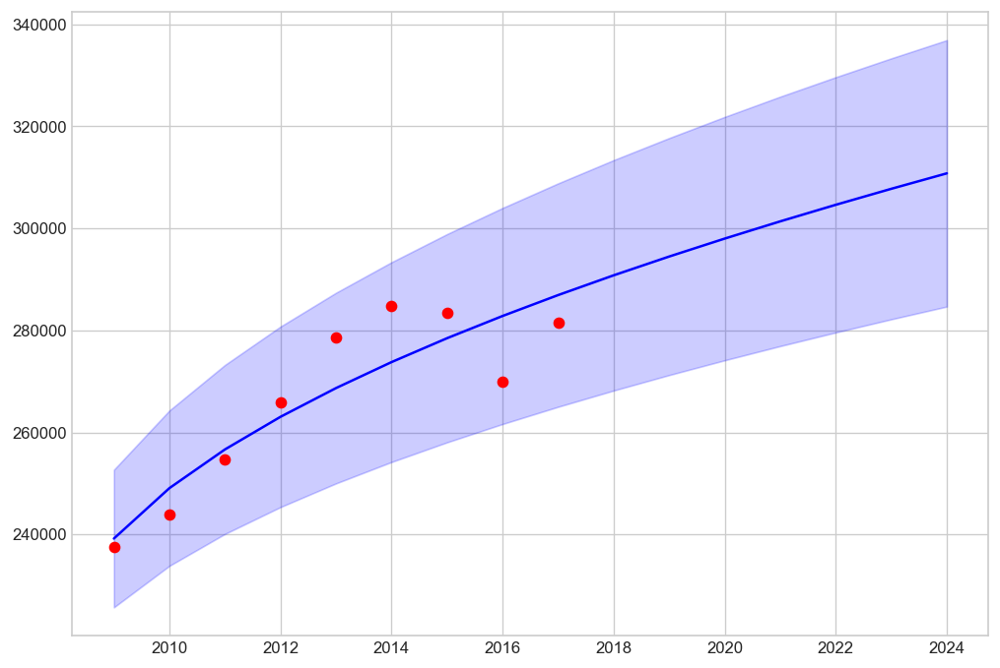

In [631]:
sigma_error = np.sqrt(np.diag(cov))
x_extra = np.arange(2009,2025,1)-2008
y_extra = fit_func(x_extra,params[0],params[1])
y_error = fit_func(x_extra,sigma_error[0],sigma_error[1])

plt.style.use('seaborn-whitegrid')
plt.plot(x_extra+2008,fit_func(x_extra,params[0],params[1]),'b-')
plt.fill_between(x_extra+2008,y_extra-y_error,y_extra+y_error,color='blue',alpha=0.2)
plt.errorbar(x_value+2008,y_value,yerr=y_measured_error,fmt='ro',elinewidth=5)

plt.show()

In [657]:
mod = sm.tsa.AutoReg(Value_ab.VALUE,[1], trend='t', seasonal=False, missing = 'drop')
res_AutoReg = mod.fit(cov_type="HC0")
res_AutoReg.summary()

/Users/dpaudyal/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.



<class 'statsmodels.iolib.summary.Summary'>
"""
                            AutoReg Model Results                             
==============================================================================
Dep. Variable:                  VALUE   No. Observations:                    9
Model:                     AutoReg(1)   Log Likelihood                 -83.008
Method:               Conditional MLE   S.D. of innovations           7762.178
Date:                Tue, 10 Mar 2020   AIC                             18.664
Time:                        21:50:51   BIC                             18.694
Sample:                             1   HQIC                            18.463
                                    9                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
trend      -1757.0876   1635.472     -1.074      0.283   -4962.553    1448.378
VALUE.L1       1.0567      0.027     39.240      0.000       1.004       1.110
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1            0.9463           +0.0000j            0.9463            0.0000
-----------------------------------------------------------------------------
"""

/Users/dpaudyal/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

/Users/dpaudyal/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.



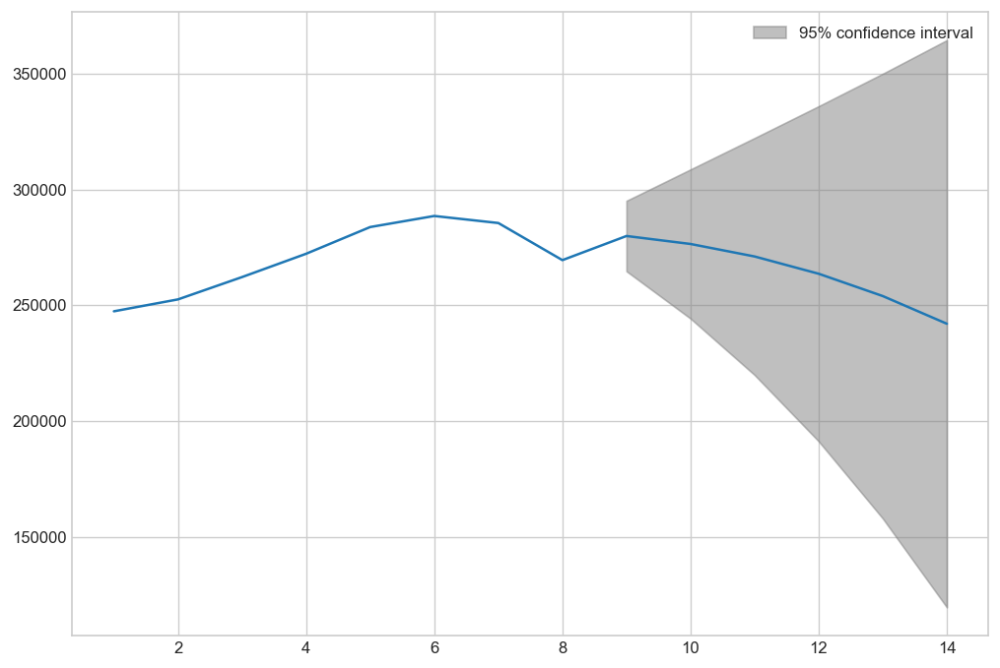

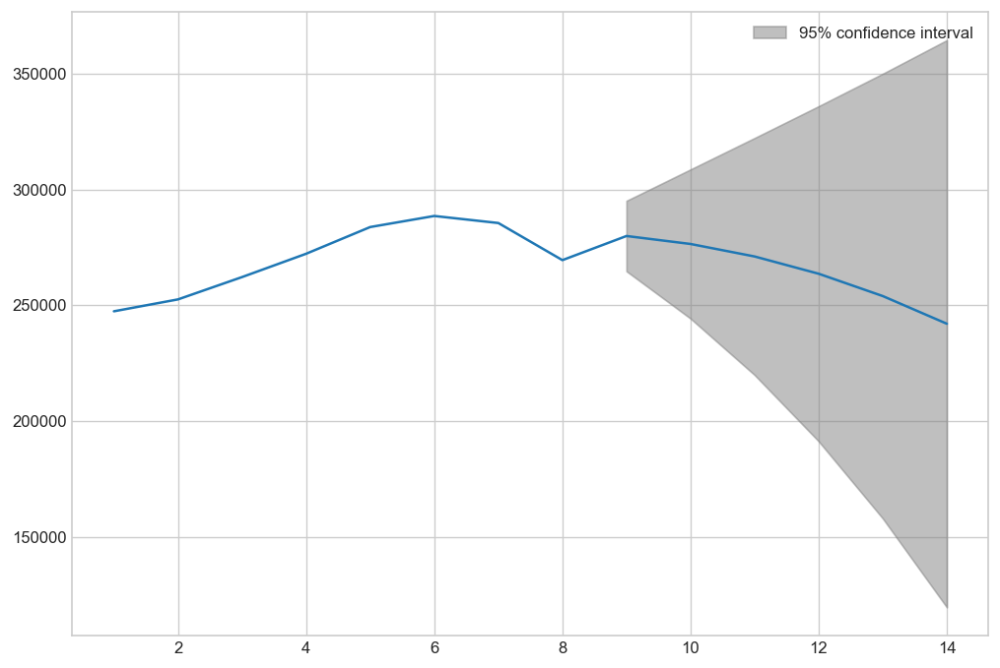

In [658]:
res_AutoReg.plot_predict(start=0,end=14)